## Creating networks from spatial data 2: Proximity

In this tutorial we'll introduce Proximity networks and how they can be generate in MuSpAn for spatial analysis.

Proximity networks are purely distance-based networks. Formally, in a Proximity network, any two nodes are connected if the distance between is within a specified range, which is defined in our case by `max_edge_distance` and `min_edge_distance`. These networks are particularly useful in spatial analysis where the physical distance between objects is a key factor. By adjusting the distance thresholds, we can explore how connectivity changes at different spatial scales. This can help in understanding the spatial organization and interactions within the dataset.

Before we get started, let's import the `Xenium-Healthy-Colon` example dataset to work on from our `datasets` module. We'll use this dataset as it contain both point-like and shape-like obejct types. 

MuSpAn domain loaded successfully. Domain summary:
Domain name: Xenium-Healthy-Colon
Number of objects: 74174
Collections: ['Cell boundaries', 'Nucleus boundaries', 'Transcripts']
Labels: ['Cell ID', 'Transcript Counts', 'Cell Area', 'Cluster ID', 'Nucleus Area', 'Transcript', 'Transcript ID'] 
Networks: [] 
Distance matrices: []


(<Figure size 2700x2700 with 4 Axes>,
 <Axes: title={'center': 'Cell centroids'}>)

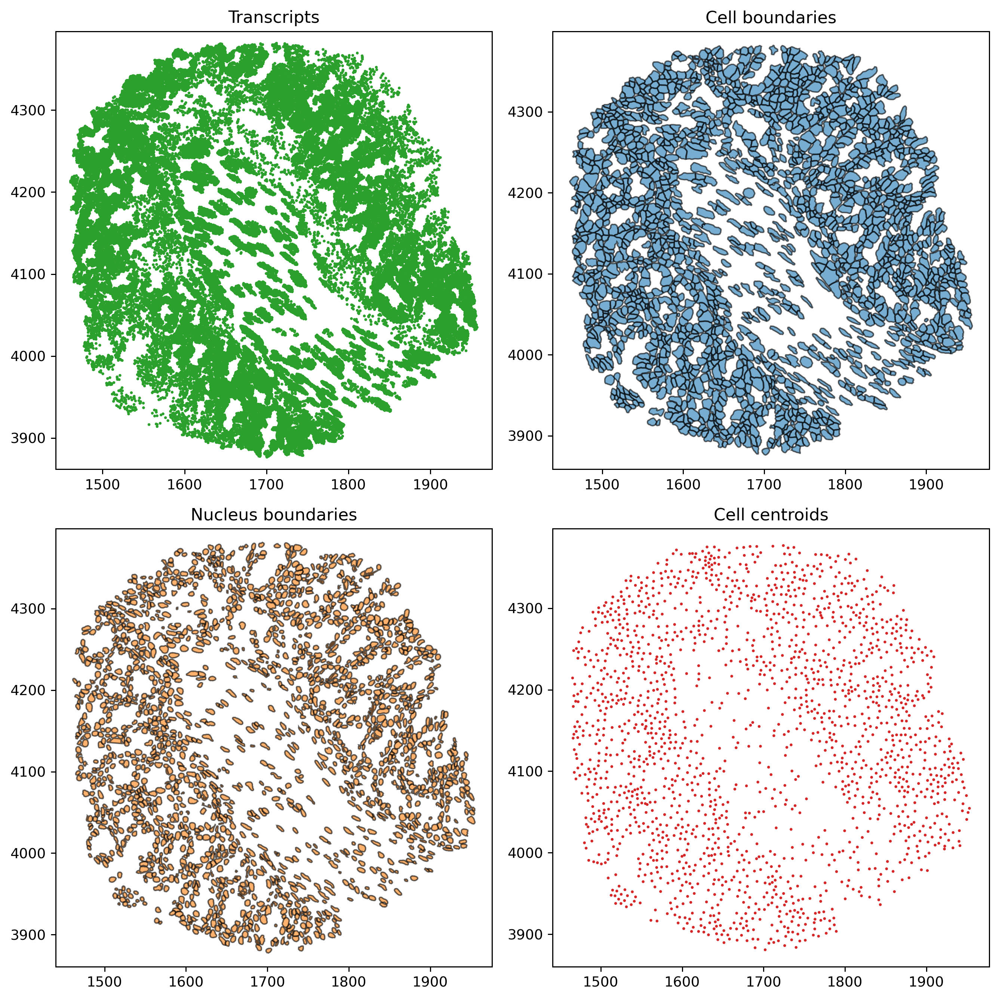

In [1]:
# Import necessary libraries
import muspan as ms
import matplotlib.pyplot as plt

# Set the resolution for plots
plt.rcParams['figure.dpi'] = 270

# Load the example domain dataset
domain = ms.datasets.load_example_domain('Xenium-Healthy-Colon')

# Add cell centroids to the domain by converting cell boundaries to centroids
domain.convert_objects(
    population=('Collection', 'Cell boundaries'),
    object_type='point',
    conversion_method='centroids',
    collection_name='Cell centroids',
    inherit_collections=False
)

# Plot the collections in the domain
fig, ax = plt.subplots(2, 2, figsize=(10, 10))

# Plot Transcripts collection
ax[0, 0].set_title('Transcripts')
ms.visualise.visualise(
    domain, ax=ax[0, 0], marker_size=1,
    objects_to_plot=('collection', 'Transcripts'), add_cbar=False
)

# Plot Cell boundaries collection
ax[0, 1].set_title('Cell boundaries')
ms.visualise.visualise(
    domain, ax=ax[0, 1], marker_size=1,
    objects_to_plot=('collection', 'Cell boundaries'), add_cbar=False
)

# Plot Nucleus boundaries collection
ax[1, 0].set_title('Nucleus boundaries')
ms.visualise.visualise(
    domain, ax=ax[1, 0], marker_size=1,
    objects_to_plot=('collection', 'Nucleus boundaries'), add_cbar=False
)

# Plot Cell centroids collection
ax[1, 1].set_title('Cell centroids')
ms.visualise.visualise(
    domain, ax=ax[1, 1], marker_size=1,
    objects_to_plot=('collection', 'Cell centroids'), add_cbar=False
)

### Creating a proximity network from point-like objects

We can use the `ms.networks.generate_network` function but now passing `Proximity` as the network type to generate proximity networks from MuSpAn objects. Let's try this on the point-like Cell centroids collection, where we can vary the distance thresholds of edge connectivity to generate different networks:

In [2]:
# Generate proximity networks with different maximum edge distances

# Proximity network with 10μm max distance
ms.networks.generate_network(
    domain,
    network_name='prox network centroids 10',
    network_type='Proximity',
    objects_as_nodes=('collection', 'Cell centroids'),
    max_edge_distance=10,
    min_edge_distance=0
)

# Proximity network with 30μm max distance
ms.networks.generate_network(
    domain,
    network_name='prox network centroids 30',
    network_type='Proximity',
    objects_as_nodes=('collection', 'Cell centroids'),
    max_edge_distance=30,
    min_edge_distance=0
)

# Proximity network with 50μm max distance
ms.networks.generate_network(
    domain,
    network_name='prox network centroids 50',
    network_type='Proximity',
    objects_as_nodes=('collection', 'Cell centroids'),
    max_edge_distance=50,
    min_edge_distance=0
)


We can check what these networks look like using our `visualise_network` function:

(<Figure size 6750x1620 with 6 Axes>,
 <Axes: title={'center': 'Proximity network: 50μm max distance'}>)

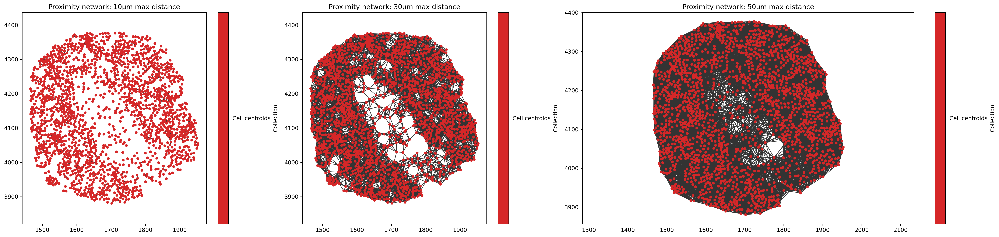

In [3]:
# Create a figure with 3 subplots arranged in a single row
fig, ax = plt.subplots(1, 3, figsize=(25, 6), gridspec_kw={'width_ratios': [1, 1, 1.8]})

# Plot the proximity network with 10μm max distance
ax[0].set_title('Proximity network: 10μm max distance')
ms.visualise.visualise_network(
    domain,
    network_name='prox network centroids 10',
    ax=ax[0],
    edge_cmap='viridis',
    edge_vmin=0,
    edge_vmax=50,
    add_cbar=False,
    visualise_kwargs=dict(objects_to_plot=('collection', 'Cell centroids'), marker_size=15)
)

# Plot the proximity network with 30μm max distance
ax[1].set_title('Proximity network: 30μm max distance')
ms.visualise.visualise_network(
    domain,
    network_name='prox network centroids 30',
    ax=ax[1],
    edge_cmap='viridis',
    edge_vmin=0,
    edge_vmax=50,
    add_cbar=False,
    visualise_kwargs=dict(objects_to_plot=('collection', 'Cell centroids'), marker_size=15)
)

# Plot the proximity network with 50μm max distance
ax[2].set_title('Proximity network: 50μm max distance')
ms.visualise.visualise_network(
    domain,
    network_name='prox network centroids 50',
    ax=ax[2],
    edge_cmap='viridis',
    edge_vmin=0,
    edge_vmax=50,
    visualise_kwargs=dict(objects_to_plot=('collection', 'Cell centroids'), marker_size=15)
)

We can use this edge distance thresholding functionality to ask questions about how the spatial structure of the data changes at different length scales, check out our documentation for all the different ways we can describe, quantify and compare networks.

### Creating a proximity network from shape-like objects

Alternatively, If we have the shape data relating the cell boundary (or any shape for that matter), we may want to use this information to generate a distance-based network.

MuSpAn is capable of computing distances any combinations of MuSpAn objects (shapes, lines, points etc) that respects the physical properties of the objects. We can use this feature to generate a Proximity network that represents physical contact of cells using our 'Cell boundary' data. Similar to above, we can use the `ms.networks.generate_network` function but now passing `Proximity` as the network type. In addition, we'll restrict connected objects that only lie <1.5μm away. 

**Note:** Computing distances between shapes can take much longer than points or lines and will scale with the number of edges that define the shape.

In [4]:
# Generate a proximity network from shape-like objects (Cell boundaries)
# with a maximum edge distance of 1.5μm

ms.networks.generate_network(
    domain,
    network_name='Contact network',
    network_type='Proximity',
    objects_as_nodes=('collection', 'Cell boundaries'),
    max_edge_distance=1.5,
    min_edge_distance=0,
    n_jobs=1
)

Let's take a looks at this network using our visualisation as in our previous network. Note that the 'Contact network' is defined between the 'Cell boundary' objects but edges will be drawn from their centroids. For purely visualisation purposes, we include the 'Cell centroids' on the plot.

(<Figure size 3240x2700 with 2 Axes>, <Axes: >)

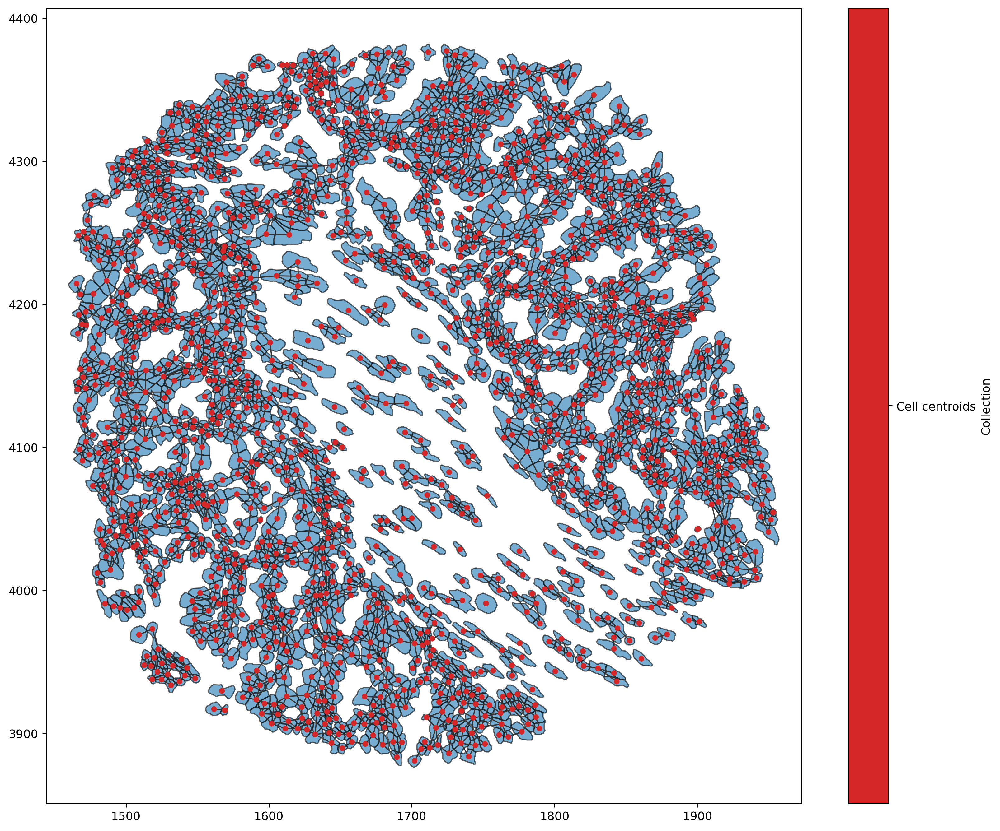

In [5]:
# Create a figure with a single subplot
fig, ax = plt.subplots(1, 1, figsize=(12, 10))

# Plot the cell boundaries underneath the network
ms.visualise.visualise(
    domain,
    ax=ax,
    objects_to_plot=('collection', 'Cell boundaries'),
    marker_size=15,
    add_cbar=False
)

# Plot the contact network on top of the cell boundaries
ms.visualise.visualise_network(
    domain,
    network_name='Contact network',
    ax=ax,
    edge_weight_name=None,
    visualise_kwargs=dict(objects_to_plot=('collection', 'Cell centroids'), marker_size=15)
)

The Proximity method provide more flexibility in distance-based network construction and in this example generates a more realistic representation of cell-cell contact when compared to the Delaunay method we used to approximate this above. Of course, these are just two simple examples and interpretations of what these networks could represented, where the context and construction of the network should guide this.